#### Group Details

* 1) Sri Maha vishnu Polisetty - 2019A4PS0321H
* 2) Samayam Arjit - 2020A3PS1353H
* 3) Shaury Trivedi - 2020A7PS1690H

In [28]:
import numpy as np  #importing necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import sklearn as sc
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.linear_model import LogisticRegression


%matplotlib inline

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/AIP-BITS/BITS-DATA/main/cancer.csv') #reading the data

#### Exploratory Data Analysis

In [3]:
df.head() #To view first five elements

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0.0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0.0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0.0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0.0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0.0


In [4]:
df.tail() #to view the last five elements

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,0.0
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,0.0
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,0.0
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,0.0
568,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,0.1587,0.05884,...,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039,1.0


In [175]:
df.info()  #to get general information about the data set such as null values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

In [177]:
df.describe() #Used to get statistical data about the dataframe

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,13.711596,18.858489,88.588102,582.374692,0.095585,0.094586,0.073166,0.041786,0.178246,0.061684,...,25.195132,101.685536,752.402988,0.130418,0.223708,0.236265,0.108027,0.281104,0.080458,0.627417
std,2.905960,3.433824,19.371247,237.542521,0.011479,0.038059,0.056286,0.028974,0.021097,0.005212,...,5.282206,25.731777,357.901249,0.018732,0.107737,0.155728,0.058231,0.040716,0.012144,0.483918
min,7.691000,11.280000,47.920000,143.500000,0.069950,0.019380,0.000000,0.000000,0.130500,0.049960,...,14.100000,50.410000,185.200000,0.087990,0.027290,0.000000,0.000000,0.181100,0.055040,0.000000
25%,11.710000,16.340000,75.210000,420.300000,0.086820,0.064920,0.029560,0.020310,0.162800,0.057700,...,21.190000,84.110000,515.300000,0.117200,0.147200,0.114500,0.064930,0.252200,0.071460,0.000000
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,1.000000
75%,15.100000,21.280000,98.000000,678.100000,0.103700,0.119200,0.108000,0.061390,0.192800,0.064910,...,28.870000,114.300000,867.100000,0.142700,0.294200,0.340200,0.152600,0.307400,0.087640,1.000000
max,20.640000,27.150000,135.100000,1247.000000,0.122500,0.195400,0.223600,0.119400,0.231000,0.074690,...,37.180000,168.200000,1780.000000,0.173700,0.509000,0.639900,0.243200,0.390000,0.113200,1.000000


In [6]:
df.isna().sum().sum() #zero null values in the entire dataframe

0

#### Data Visualisation

<AxesSubplot:xlabel='mean radius', ylabel='mean texture'>

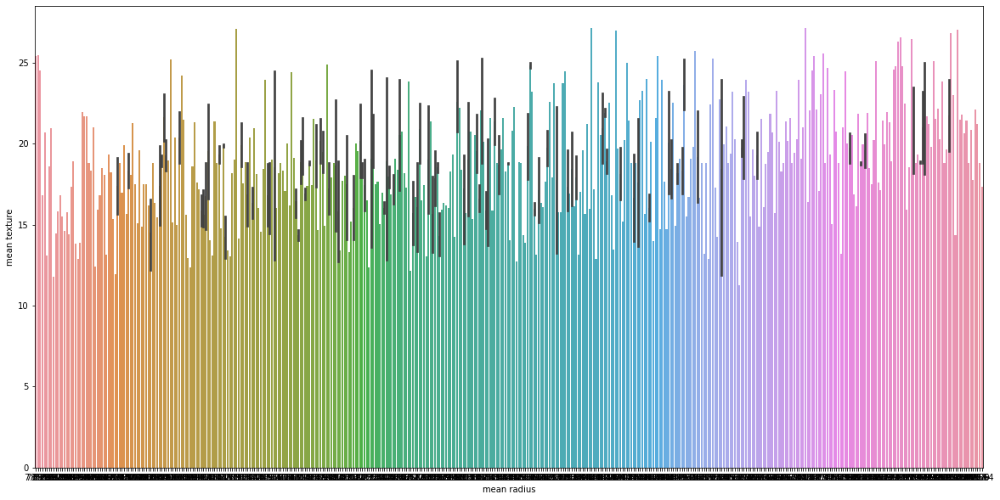

In [70]:
plt.figure(figsize=(20,10))
sns.barplot(x='mean radius',y='mean texture',data=df) #To get a visualisation between the mean radius and mean texture

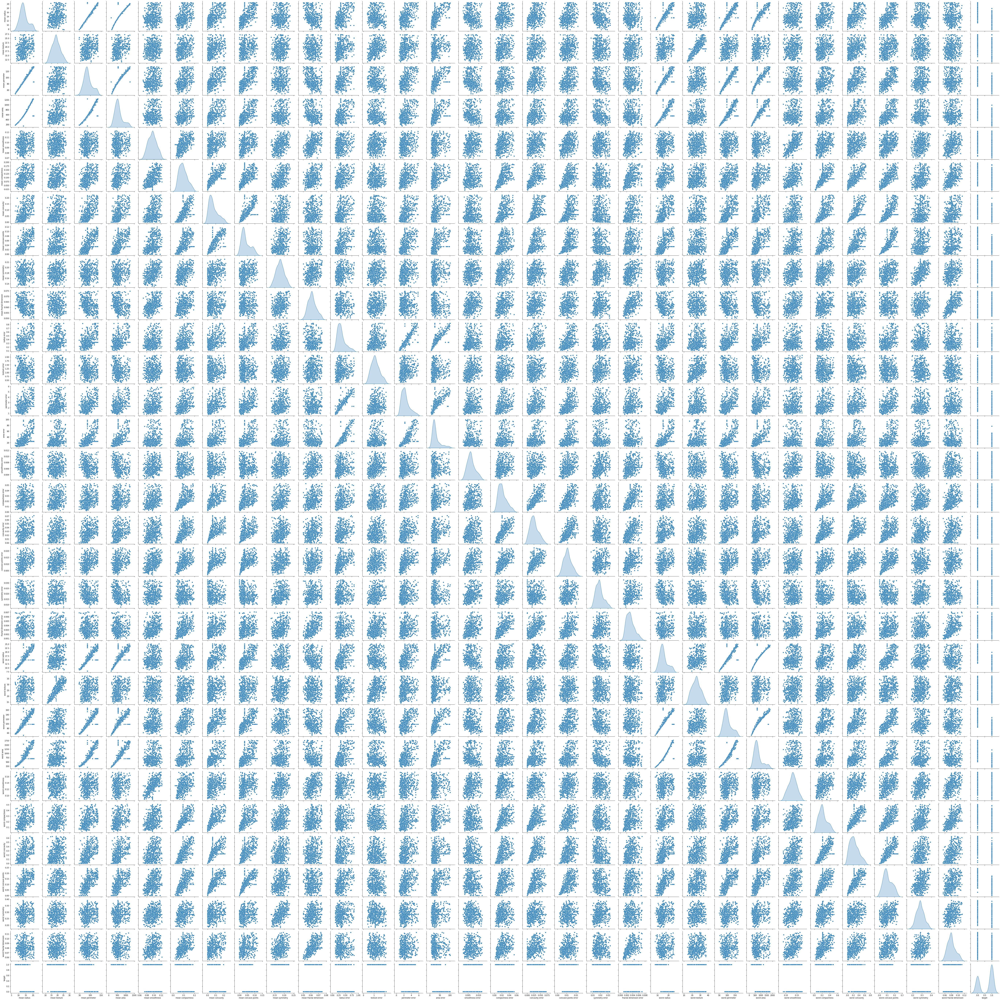

In [71]:
sns.pairplot(df, diag_kind = 'kde')  #A visualisation of corelation between each column.

<AxesSubplot:xlabel='target', ylabel='mean fractal dimension'>

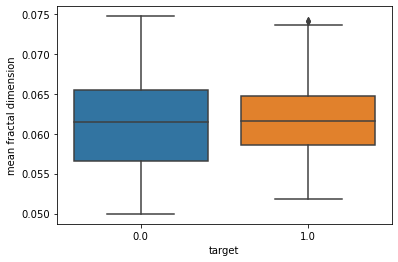

In [72]:
sns.boxplot(x='target',y='mean fractal dimension',data=df)  
#Represents a box plot between target and mean fractal dimension to understand where the percentiles stand for this column

<AxesSubplot:xlabel='target', ylabel='mean fractal dimension'>

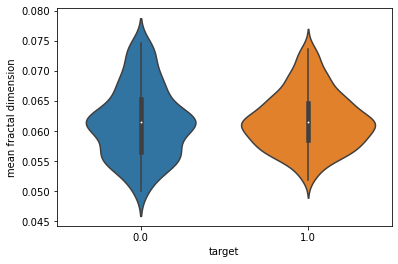

In [73]:
sns.violinplot(x='target',y='mean fractal dimension',data=df)
#A violin plot between target and mean fractal dimension

<AxesSubplot:xlabel='target', ylabel='mean fractal dimension'>

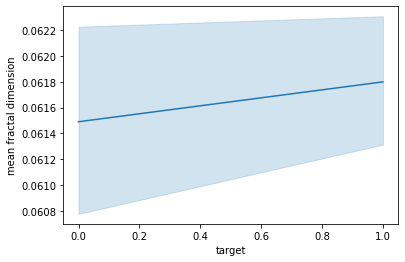

In [74]:
sns.lineplot(x='target',y='mean fractal dimension',data=df) 
#A line plot showing the linear relationship between the two features

<AxesSubplot:xlabel='target', ylabel='count'>

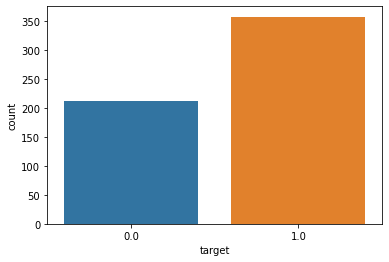

In [75]:
sns.countplot(x='target',data=df) #Gives a plot to show total number of 0s and 1s

#### Data Preprocessing

In [179]:
def replace_outlier(val, mean, std): #only keeping the data values which are within 2 standard deviations from mean
    if val > mean + 2*std:
        return median 
    elif val < mean - 2*std:
        return median 
    return val
for col in df.columns:

  med = df[col].median()
  mean = df[col].mean()
  std = df[col].std(axis=0)
  df[col] = df[col].map(lambda x: replace_outlier(x, mean, std_dev))

In [180]:
X = df.iloc[:, 0:30].values  
y = df.iloc[:,30].values

In [181]:
from sklearn.model_selection import train_test_split  
#Importing train test split which can be used to divide data for training and testing
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size = 0.2, shuffle=True,random_state=101)
#Using 20 percent of data for testing and 80 percent of data for training

In [79]:
df['target'].value_counts() #To show number of 0s and 1s in the target variable.

1.0    357
0.0    212
Name: target, dtype: int64

#### Base classifier

In [80]:
lg=LogisticRegression() #Instantiating an object lg of class Logistic Regression

In [81]:
lg.fit(X_train, y_train) #Training the classifier

C:\Users\HP\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [82]:
y_pred=lg.predict(X_test) #Getting predictions from the classifier

In [83]:
print(classification_report(y_test,y_pred)) #Printing the classification report for the model

              precision    recall  f1-score   support

         0.0       0.89      0.79      0.84        42
         1.0       0.88      0.94      0.91        72

    accuracy                           0.89       114
   macro avg       0.89      0.87      0.87       114
weighted avg       0.89      0.89      0.88       114



Obtained an accuracy of 89% with the base model which is logistic regression

In [88]:
#Hyperparameter tuning for logistic regression
from sklearn.model_selection import GridSearchCV
parameters = [{'penalty': ['l1', 'l2'], 
               'C': [0.001, 0.01, 0.1, 10, 100, 1000],
               'solver': ['liblinear', 'sag', 'saga']}]


grid_search = GridSearchCV(estimator = lg, param_grid = parameters, scoring = 'accuracy', cv = 10, n_jobs = -1)

grid_search.fit(X_train, y_train) #training with best parameters
best_accuracy_log = grid_search.best_score_
best_parameters = grid_search.best_params_

print(best_accuracy_log) #printing the accuracy log
print(best_parameters)

0.9562801932367149
{'C': 1000, 'penalty': 'l2', 'solver': 'liblinear'}


C:\Users\HP\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [0.82652174        nan 0.8221256  0.84178744 0.82850242 0.83072464
 0.83743961        nan 0.82855072 0.85280193 0.83072464 0.83072464
 0.85285024        nan 0.83072464 0.85714976 0.83072464 0.83072464
 0.94966184        nan 0.83072464 0.92096618 0.83072464 0.83072464
 0.95391304        nan 0.83072464 0.94961353 0.83072464 0.83072464
 0.94072464        nan 0.83072464 0.95628019 0.83072464 0.83072464]
  warnings.warn(
C:\Users\HP\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


In [90]:
y_pred=grid_search.predict(X_test) #Obtaining predictions for our grid search model of logistic regression

In [91]:
print(classification_report(y_test,y_pred)) 
#printing the classification report for the grid search model of logistic regression

              precision    recall  f1-score   support

         0.0       0.91      0.93      0.92        42
         1.0       0.96      0.94      0.95        72

    accuracy                           0.94       114
   macro avg       0.93      0.94      0.93       114
weighted avg       0.94      0.94      0.94       114



Hence accuracy has been improved from 89 to 95 using grid search cv

#### Decision Tree Classifier

In [93]:
from sklearn.preprocessing import StandardScaler #importing standard scaler from scikit learn package
sc = StandardScaler()
X_scaled = sc.fit_transform(X)

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y,test_size = 0.2, shuffle=True,random_state=101)

from datetime import datetime as dt
start = dt.now()
dc = DecisionTreeClassifier (criterion = 'entropy', random_state = 0)
dc.fit (X_train, y_train)
running_secs = (dt.now() - start).seconds

y_pred = dc.predict (X_test)


print("Execution time = ", running_secs)

print(classification_report(y_pred,y_test))

Execution time =  0
              precision    recall  f1-score   support

         0.0       0.90      0.88      0.89        43
         1.0       0.93      0.94      0.94        71

    accuracy                           0.92       114
   macro avg       0.92      0.91      0.92       114
weighted avg       0.92      0.92      0.92       114



Obtained an accuracy of 92 percent with decision tree classifier

#### Using PCA

In [95]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)

X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

explained_variance = pca.explained_variance_ratio_

start = dt.now()
dc = DecisionTreeClassifier (criterion = 'entropy', random_state = 0, max_depth=10)
dc.fit (X_train, y_train)
running_secs = (dt.now() - start).seconds

y_pred = dc.predict(X_test)


print("Execution time = ", running_secs)

print(classification_report(y_pred,y_test))


Execution time =  0
              precision    recall  f1-score   support

         0.0       0.98      0.79      0.87        52
         1.0       0.85      0.98      0.91        62

    accuracy                           0.89       114
   macro avg       0.91      0.89      0.89       114
weighted avg       0.91      0.89      0.89       114



Using PCA, the accuracy is 89%

In [105]:
parameters = [
    {'criterion':['gini','entropy'],
     'max_depth':[4,5,6,7,8,9,10,11,12,13,14,15], 
     'max_leaf_nodes': [2,4,6,10,15], 
     'min_samples_split': [2, 3, 4]}]

start = dt.now()
dc = DecisionTreeClassifier (criterion = 'entropy', random_state = 0, max_depth= 20, max_leaf_nodes= 40, min_samples_split = 2)

dc.fit(X_train, y_train) #Training the decision tree classifier with parameters
running_secs = (dt.now() - start).seconds



print("Execution time = ", running_secs)




Execution time =  0


In [104]:
from sklearn.model_selection import GridSearchCV
grid_search = GridSearchCV(estimator = dc, param_grid = parameters, scoring = 'accuracy', cv = 10, n_jobs = -1)

grid_search.fit(X_train, y_train) #training our model on the best parameters
grid_search.best_params_

y_pred=grid_search.predict(X_test)

print(classification_report(y_pred,y_test))


              precision    recall  f1-score   support

         0.0       0.95      0.91      0.93        44
         1.0       0.94      0.97      0.96        70

    accuracy                           0.95       114
   macro avg       0.95      0.94      0.94       114
weighted avg       0.95      0.95      0.95       114



After applying grid search cv, the accuracy went upto 95% from 92%.

#### Naive Baiyes Classifier

Complement Naive Bayes

In [145]:
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size = 0.2, shuffle=True,random_state=101)
import time

In [168]:
from sklearn.naive_bayes import ComplementNB
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from math import *

cnb = ComplementNB() 
t0=time.time()
cnb.fit(X_train, y_train)
t1 = time.time()

cross_cnb = cross_val_score(cnb, X, y)

y_pred=cnb.predict(X_test)

print(classification_report(y_test,y_pred))

t2 = time.time()
y_pred_cnb =cnb.predict(X_test)
t3 = time.time()


              precision    recall  f1-score   support

         0.0       0.82      0.74      0.78        42
         1.0       0.86      0.90      0.88        72

    accuracy                           0.84       114
   macro avg       0.84      0.82      0.83       114
weighted avg       0.84      0.84      0.84       114



With Complement Naive Baiyes, obtained an accuracy of 84%

Multinomial Naive Bayes

In [169]:
from sklearn.naive_bayes import MultinomialNB

mnb = MultinomialNB() 
t0=time.time()
mnb.fit(X_train, y_train)
t1 = time.time()

cross_mnb = cross_val_score(mnb, X, y)

y_pred=mnb.predict(X_test)

print(classification_report(y_test,y_pred))

t2 = time.time()
y_pred_mnb =mnb.predict(X_test)
t3 = time.time()



              precision    recall  f1-score   support

         0.0       0.83      0.71      0.77        42
         1.0       0.85      0.92      0.88        72

    accuracy                           0.84       114
   macro avg       0.84      0.82      0.82       114
weighted avg       0.84      0.84      0.84       114



With Multinomial Naive Bayes, obtained an accuracy of 84%

Gaussian Naive Bayes

In [174]:
from sklearn.naive_bayes import GaussianNB
from math import *

gnb = GaussianNB()
t0 = time.time() 
gnb.fit(X_train, y_train)
t1 = time.time()
#cross_cnb = cross_val_score(cnb, X, y,n_jobs = -1)
cross_gnb = cross_val_score(gnb, X, y)

print("Cross Validation score = ",cross_gnb)                

print ("Train accuracy ={:.2f}%".format(gnb.score(X_train,y_train)*100))
print ("Test accuracy ={:.2f}%".format(gnb.score(X_test,y_test)*100))

t2 = time.time()
y_pred_gnb =gnb.predict(X_test)
t3 = time.time()



Cross Validation score =  [0.90350877 0.93859649 0.95614035 0.93859649 0.92920354]
Train accuracy =93.63%
Test accuracy =93.86%


With Gaussian Naive Bayes, obtained an accuracy of 93%

Bernoulli Naive Bayes

In [171]:
from sklearn.naive_bayes import BernoulliNB

bnb = BernoulliNB() 
t0=time.time()
bnb.fit(X_train, y_train)
t1 = time.time()
#cross_cnb = cross_val_score(cnb, X, y,n_jobs = -1)
cross_bnb = cross_val_score(bnb, X, y)

t2 = time.time()
y_pred_bnb =bnb.predict(X_test)
t3 = time.time()

y_pred=bnb.predict(X_test)

print(classification_report(y_test,y_pred))


              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        42
         1.0       0.63      1.00      0.77        72

    accuracy                           0.63       114
   macro avg       0.32      0.50      0.39       114
weighted avg       0.40      0.63      0.49       114



C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


With Bernoulli Naive Bayes, obtained an accuracy of 63%

After training on 4 different types of naive bayes classifiers, the best classifier obtained is Gaussian Naive Bayes algorithm
and the Bernoulli Naive Bayes performed the worst

Now, let us further tune the Gaussian Naive Bayes and see if we can get better results

In [172]:
param_grid = {
    'var_smoothing': np.logspace(0,-9, num=100)  #Taking variable smoothing as the parameter
}
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV

grid_search = GridSearchCV(estimator=GaussianNB(), param_grid=param_grid, verbose=1, cv=10, n_jobs=-1)
t0=time.time()

grid_search.fit(X_train, y_train) #training to find the best parameters
t1=time.time()
print(grid_search.best_estimator_)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
GaussianNB(var_smoothing=1.519911082952933e-09)


In [173]:
from sklearn.naive_bayes import GaussianNB
from math import *

grid_search = GaussianNB(var_smoothing=1.519911082952933e-09) #implementing on the best parameter obtained from grid search
t0 = time.time() 
grid_search.fit(X_train, y_train)
t1 = time.time()

cross_gnb = cross_val_score(gnb, X, y)


t2 = time.time()
y_pred =grid_search.predict(X_test)
t3 = time.time()



trainingtime_list.append(t1-t0)

predictiontime_list.append(t3-t2)

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.87      0.98      0.92        42
         1.0       0.99      0.92      0.95        72

    accuracy                           0.94       114
   macro avg       0.93      0.95      0.94       114
weighted avg       0.94      0.94      0.94       114



Hence, the accuracy improved from 93 to 94 using gridsearchCV

#### Support Vector Classifier

In [135]:
from sklearn.svm import SVC
svc = SVC()

X_train, X_test, y_train, y_test = train_test_split(X, y,test_size = 0.2, random_state=101)
svc.fit(X_train, y_train)

SVC()

In [136]:
y_pred=svc.predict(X_test)

print(confusion_matrix(y_test,y_pred)) #printing the confusion matrix

print(classification_report(y_test,y_pred))

[[30 12]
 [ 2 70]]
              precision    recall  f1-score   support

         0.0       0.94      0.71      0.81        42
         1.0       0.85      0.97      0.91        72

    accuracy                           0.88       114
   macro avg       0.90      0.84      0.86       114
weighted avg       0.88      0.88      0.87       114



SVC Gave an accuracy of 88% without any hyperparameter tuning. Let us further improve the accuracy using grid search cv

In [137]:
from sklearn.model_selection import GridSearchCV
#Defining the parameter grid for svc
param_grid = {'C':[0.001,0.01,0.1,1,10,100,1000],'gamma':[100,10,1,0.1,0.01,0.001,0.001], 'kernel':['rbf']}

grid = GridSearchCV(svc,param_grid,verbose = 4)
grid.fit(X_train,y_train)



Fitting 5 folds for each of 49 candidates, totalling 245 fits
[CV 1/5] END ....C=0.001, gamma=100, kernel=rbf;, score=0.626 total time=   0.0s
[CV 2/5] END ....C=0.001, gamma=100, kernel=rbf;, score=0.626 total time=   0.0s
[CV 3/5] END ....C=0.001, gamma=100, kernel=rbf;, score=0.626 total time=   0.0s
[CV 4/5] END ....C=0.001, gamma=100, kernel=rbf;, score=0.626 total time=   0.0s
[CV 5/5] END ....C=0.001, gamma=100, kernel=rbf;, score=0.626 total time=   0.0s
[CV 1/5] END .....C=0.001, gamma=10, kernel=rbf;, score=0.626 total time=   0.0s
[CV 2/5] END .....C=0.001, gamma=10, kernel=rbf;, score=0.626 total time=   0.0s
[CV 3/5] END .....C=0.001, gamma=10, kernel=rbf;, score=0.626 total time=   0.0s
[CV 4/5] END .....C=0.001, gamma=10, kernel=rbf;, score=0.626 total time=   0.0s
[CV 5/5] END .....C=0.001, gamma=10, kernel=rbf;, score=0.626 total time=   0.0s
[CV 1/5] END ......C=0.001, gamma=1, kernel=rbf;, score=0.626 total time=   0.0s
[CV 2/5] END ......C=0.001, gamma=1, kernel=rbf

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'gamma': [100, 10, 1, 0.1, 0.01, 0.001, 0.001],
                         'kernel': ['rbf']},
             verbose=4)

In [138]:
print(grid.best_estimator_)

SVC(C=100, gamma=0.001)


In [139]:
y_pred=grid.predict(X_test)

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.93      0.93      0.93        42
         1.0       0.96      0.96      0.96        72

    accuracy                           0.95       114
   macro avg       0.94      0.94      0.94       114
weighted avg       0.95      0.95      0.95       114



Obtained an accuracy of 95% after performing hyperparameter tuning using gridsearchcv

After training all the models, the best model which we got is Support Vector Machines and Decision Trees with an accuracy of 95%. These models both gave the best results after hyperparameter tuning.

Comparing the precision scores for SVM and Decision Trees:
For SVM, precision score is 93 for class 0 and 96 for class 1
For Decision Trees, precision score is 95 for class 0 and 94 for class 1

Comparing the recall scores for SVM and Decision Trees:
For SVM, the recall is 93 for class 0 and 96 for class 1
For Decision Trees, the recall is 91 for class 0 and 97 for class 1

Comparing the F1 scores for SVM and Decision Trees;
For SVM, the f1 score is 93 for class 0 and 96 for class 1
For Decision Trees, the f1 score is 93 for class 0 and 96 for class 1

Since the prediction time is generally always in milliseconds, we got 0s for both. The time being very small does not affect the performance as the data is limited and not huge.